<a href="https://colab.research.google.com/github/caoimheburke/AMA3022_W_B/blob/main/All_Allstate_Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Preparing Data for Use 

In [1]:
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd 
import seaborn as sns
from datetime import date

#import excel file 
from google.colab import files
uploaded = files.upload()

#name columns 
column_names = ["bike_number",	"station_from",	"station_to",	"time_from",	"time_to",	"trip_time_mins",	"date"]
bbikes_df= pd.read_csv("./Modified_Excel_Final.csv", names=column_names)

#drop 1st row (repeat of headings)
bbikes_df = bbikes_df.drop([0])

# Creating datetime object
bbikes_df['NewDate']  = pd.to_datetime(bbikes_df['date'], errors='coerce').dt.normalize()#normalise
print(bbikes_df)

# Creating day, month, year variables 
bbikes_df['year'] = pd.DatetimeIndex(bbikes_df['NewDate']).year
bbikes_df['month_short'] = bbikes_df['NewDate'].dt.month_name().str[:3]
bbikes_df['day_short'] = bbikes_df['NewDate'].dt.day_name().str[:3]

print(bbikes_df)

Saving Modified_Excel_Final.csv to Modified_Excel_Final.csv
       bike_number station_from  station_to time_from   time_to  \
1            83165     AllState       AlfSt  12:43:47  12:49:48   
2            83076     AllState       AlfSt  17:54:47  18:01:47   
3            82974     AllState       AlfSt  17:47:47  17:54:48   
4            82880     AllState       AlfSt  13:59:47  14:17:48   
5           830397     AllState       AlfSt  08:19:47  08:48:48   
...            ...          ...         ...       ...       ...   
100269       83342        VicSq  Waterfront  18:09:48  20:13:48   
100270       83222        VicSq  Waterfront  18:09:48  20:14:47   
100271       83115        VicSq  Waterfront  18:09:48  20:15:48   
100272      830089        VicSq  Waterfront  11:18:48  13:30:47   
100273      830180        VicSq  Waterfront  15:03:47  18:03:47   

       trip_time_mins        date    NewDate  
1         6.002286367  15/01/2020 2020-01-15  
2          6.99872675  15/01/2020 2020-01

In [2]:
#finding avgs 
bbikes_df.describe()

,year
count,100273.000000
mean,2020.475901
std,0.509386
min,2019.000000
25%,2020.000000
50%,2020.000000
75%,2021.000000
max,2021.000000


#Creating COVID Graphs

Note: 
*   'journeys' raw data taken directly from Excel sheet.
*   All covid stats were entered as raw data, taken from various websites that have been referenced


 


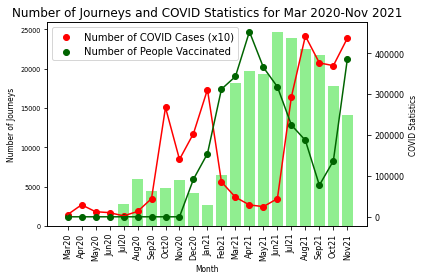

In [3]:
import numpy as np
from matplotlib import pyplot as plt

x = ['Mar20', 'Apr20', 'May20', 'Jun20', 'Jul20', 'Aug20', 'Sep20', 'Oct20', 'Nov20', 'Dec20', 'Jan21', 'Feb21', 'Mar21', 'Apr21', 'May21', 'Jun21', 'Jul21', 'Aug21', 'Sep21', 'Oct21', 'Nov21']
t = np.arange(0, 20000, 5000)
journeys= [0, 0, 0, 5, 2847, 5964, 4490, 4803, 5881, 4256, 2631, 6477, 18208, 19691, 19281, 24647, 23872, 22529, 21701, 17762, 14076]
vaccinated = [0,0,0,0,0,0,0,0,0, 91954, 154467, 312176, 343169, 452834, 365507, 317951, 224583, 186946, 77215, 136671, 385381]
ratiovacc = [0,0,0,0,0,0,0,0,0.00734, 0.01295, 0.01747, 0.07671, 0.22223, 0.35103, 0.45853, 0.54943, 0.61240, 0.63614, 0.65478, 0.66989, 0.68238]
cases=[5330, 29300, 12460, 10140, 2250, 12970, 44480, 267380, 140340, 203690, 311260, 85330, 47960, 29060, 24880, 44390, 293230, 442150, 376400, 369720, 436750]

fig, ax1 = plt.subplots()
color = 'tab:red'
plt.xticks(rotation=90)
ax1.set_xlabel('Month', fontsize=7.5)
ax1.set_ylabel('Number of Journeys', fontsize=7.5)
#ax1.bar(x, journeys, color='lightgreen')
plt.yticks(fontsize=6.5)
ax1.tick_params(axis='y', labelcolor='black')
plt.xticks(fontsize=8)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:blue'
ax2.set_ylabel('COVID Statistics', fontsize=7.5)  # we already handled the x-label with ax1
ax2.scatter(x, cases, label="Number of COVID Cases (x10)", color='red')
ax2.plot(x, cases, color='red')
ax2.scatter(x, vaccinated, label="Number of People Vaccinated", color='darkgreen')
ax2.plot(x, vaccinated, color='darkgreen')

plt.legend()
plt.yticks(fontsize=6.5)
ax2.tick_params(axis='y', labelcolor='black')
plt.yticks(fontsize=8)
plt.xticks(fontsize=8)

ax1.bar(x, journeys, label="No. Journeys", color='lightgreen')

plt.title("Number of Journeys and COVID Statistics for Mar 2020-Nov 2021")
plt.tight_layout()
plt.savefig("COVIDgraphStats.pdf", bboxes_inches='tight', width=1)

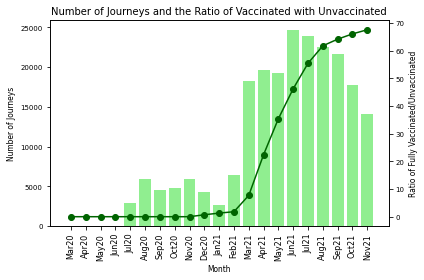

In [4]:

import numpy as np 
from matplotlib import pyplot as plt

x = ['Mar20', 'Apr20', 'May20', 'Jun20', 'Jul20', 'Aug20', 'Sep20', 'Oct20', 'Nov20', 'Dec20', 'Jan21', 'Feb21', 'Mar21', 'Apr21', 'May21', 'Jun21', 'Jul21', 'Aug21', 'Sep21', 'Oct21', 'Nov21']

t = np.arange(0, 20000, 5000)
journeys= [0, 0, 0, 5, 2847, 5964, 4490, 4803, 5881, 4256, 2631, 6477, 18208, 19691, 19281, 24647, 23872, 22529, 21701, 17762, 14076]
ratiovacc = [0,0,0,0,0,0,0,0,0,0.7,1.3,1.8,7.7,22.4,35.4,46.2,55.4,61.7,64.1,66.0,67.5]

fig, ax1 = plt.subplots()

color = 'tab:red'
plt.xticks(rotation=90)
ax1.set_xlabel('Month', fontsize=7.5)
ax1.set_ylabel('Number of Journeys', fontsize=7.5)
ax1.bar(x, journeys, label="No. Journeys", color='lightgreen')
plt.yticks(fontsize=7)
ax1.tick_params(axis='y', labelcolor='black')
plt.xticks(fontsize=8)

ax2 = ax1.twinx()  

color = 'tab:blue'
ax2.set_ylabel('Ratio of Fully Vaccinated/Unvaccinated', fontsize=7.5)

ax2.scatter(x, ratiovacc, color='darkgreen')
ax2.plot(x, ratiovacc, color='darkgreen')
plt.yticks(fontsize=7)

ax2.tick_params(axis='y', labelcolor='black')
plt.title("Number of Journeys and the Ratio of Vaccinated with Unvaccinated", fontsize=10)
plt.tight_layout()
plt.savefig("COVIDgraphRatio.pdf", bboxes_inches='tight', width=1)
#fig.tight_lay


In [5]:
#COVID ratio graph correlation

from scipy.stats import pearsonr
# data
numberjourneys = [0, 0, 0, 5, 2847, 5964, 4490, 4803, 5881, 4256, 2631, 6477, 18208, 19691, 19281, 24647, 23872, 22529, 21701, 17762, 14076]
ratio = [0,0,0,0,0,0,0,0,0,0.7,1.3,1.8,7.7,22.4,35.4,46.2,55.4,61.7,64.1,66.0,67.5]
# calculate Pearson's correlation
corr, _ = pearsonr(numberjourneys, ratio)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: 0.832


#Seaborn

In [6]:
# Setting all graphs to be visualized using Seaborn 

import seaborn as sns
#sns.set()
sns.set_style('darkgrid', {'axes.linewidth': 1, 'axes.edgecolor':'black'})

#Creating Weather Graphs for Number of Journeys and Trip Time

Re-making graphs from Statista using their data so we can specify our own time frame 

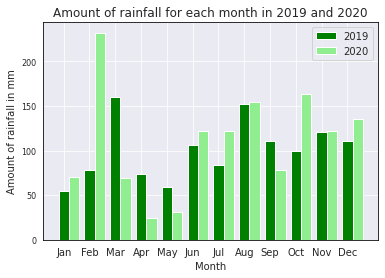

In [7]:
w=0.4
x=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

y1=[55.1, 78.4, 160.4, 73.3, 59.4, 106.5, 83.5, 152.6, 110.2, 99.2, 120.6, 110.8]
#y1old = [12791, 12692, 11783, 12931, 15909, 14170, 15006, 13266, 11574, 11885, 8830, 7314]
#y1old2 =[161583.2, 156522.1667, 149611.63333, 187608.1833, 225051.9333, 207227.08333, 219786.4833, 211602.1, 167946.3667, 155479.3667, 111748.4333, 87814.35]

y2=[70, 231.9, 69.7, 23.9, 31, 121.3, 121.3, 153.9, 78.2, 162.8, 122.1, 135.6]
#y2old = [10110, 8184, 5005, 0, 0, 5, 2847, 5964, 4490, 4803, 5881, 4256]
#y2old2 =[118272.0298, 99189.54877, 68058.50188, 0, 0, 156.9862449, 55560.35849, 103211.4214, 85219.87655, 69240.99322, 82279.90601, 73158.81257]

bar1 = np.arange(len(x))
bar2 = [i+w for i in bar1]

plt.bar(x, y1, w, label="2019",color="green")
plt.bar(bar2, y2, w, label="2020",color="lightgreen")

plt.xlabel("Month")
plt.ylabel("Amount of rainfall in mm")
plt.yticks(fontsize=8)
plt.title("Amount of rainfall for each month in 2019 and 2020")
plt.xticks()
plt.legend()
plt.savefig('statistarain.pdf')
plt.show()


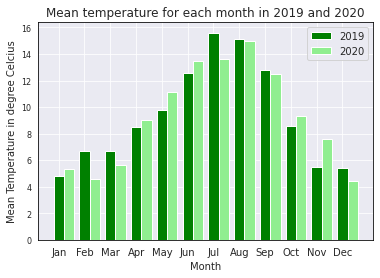

In [8]:
w=0.4
x = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
y1=[4.8, 6.7, 6.7, 8.5, 9.8, 12.6, 15.6, 15.1, 12.8, 8.6, 5.5, 5.4]
y2=[5.3, 4.6, 5.6, 9, 11.1, 13.5, 13.6, 15, 12.5, 9.3, 7.6, 4.4]
bar1 = np.arange(len(x))
bar2 = [i+w for i in bar1]

plt.bar(x, y1, w, label="2019",color="green")
plt.bar(bar2, y2, w, label="2020",color="lightgreen")

plt.xlabel("Month")
plt.ylabel("Mean Temperature in degree Celcius")
plt.yticks(fontsize=8)
plt.title("Mean temperature for each month in 2019 and 2020")
plt.xticks()
plt.legend()
plt.savefig('statistasunshine.pdf')
plt.show()

Note: 
*   'journeys' raw data taken directly from Excel sheet.
*   'Total trip time' raw data taken directly from Excel sheet.
*    Avg calculated by dividing journeys by total time by hand. 
*    Only used 1 of 3 graphs and referenced others as they all show similar things.


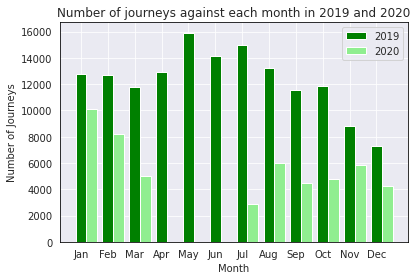

In [9]:
# Using number of journeys as before 

# Plotting no. of Journeys for 2019 and 2020

w=0.4
x = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

y1 = [12791, 12692, 11783, 12931, 15909, 14170, 15006, 13266, 11574, 11885, 8830, 7314]

y2 = [10110, 8184, 5005, 0, 0, 5, 2847, 5964, 4490, 4803, 5881, 4256]

bar1 = np.arange(len(x))
bar2 = [i+w for i in bar1]

plt.bar(x, y1, w, label="2019",color="green")
plt.bar(bar2, y2, w, label="2020",color="lightgreen")

plt.xlabel("Month")
plt.ylabel("Number of Journeys")
plt.title("Number of journeys against each month in 2019 and 2020")
plt.xticks()
plt.tight_layout()
plt.legend()
plt.savefig('Monthly_journeys_both.pdf')
plt.show()

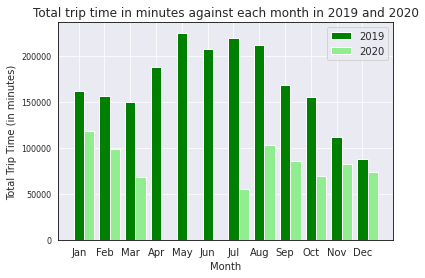

In [10]:
# Plotting Total Trip Time for 2019 and 2020

w=0.4
x = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
y1 =[161583.2, 156522.1667, 149611.63333, 187608.1833, 225051.9333, 207227.08333, 219786.4833, 211602.1, 167946.3667, 155479.3667, 111748.4333, 87814.35]


y2 =[118272.0298, 99189.54877, 68058.50188, 0, 0, 156.9862449, 55560.35849, 103211.4214, 85219.87655, 69240.99322, 82279.90601, 73158.81257]

bar1 = np.arange(len(x))
bar2 = [i+w for i in bar1]

plt.bar(x, y1, w, label="2019",color="green")
plt.bar(bar2, y2, w, label="2020",color="lightgreen")

plt.xlabel("Month")
plt.ylabel("Total Trip Time (in minutes)")
plt.yticks(fontsize=8)
plt.title("Total trip time in minutes against each month in 2019 and 2020")
plt.xticks()
plt.legend()
plt.savefig('Monthly_TTT_both.pdf')
plt.show()

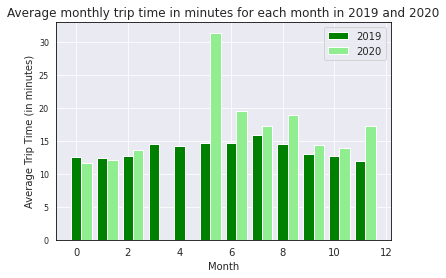

In [11]:
# Plotting Avg Trip Time for 2019 and 2020

w=0.4
x=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

y1=[12.63, 12.33, 12.69, 14.51, 14.15, 14.62, 14.65, 15.95, 14.51, 13.08, 12.66, 12.01]
y2=[11.70, 12.12, 13.60, 0, 0, 31.40, 19.52, 17.31, 18.98, 14.42, 13.99, 17.19]

bar1 = np.arange(len(x))
bar2 = [i+w for i in bar1]

plt.bar(bar1, y1, w, label="2019",color="green")
plt.bar(bar2, y2, w, label="2020",color="lightgreen")

plt.xlabel("Month")
plt.ylabel("Average Trip Time (in minutes)")
plt.yticks(fontsize=8)
plt.title("Average monthly trip time in minutes for each month in 2019 and 2020")
plt.xticks()
plt.legend()
plt.savefig('Monthly_ATT_both.pdf')
plt.show()

Pearson's Correlation 

In [12]:
#Pearson's correlation between number of journeys 2019 and rain 2019
from scipy.stats import pearsonr
#data
numberjourneys = [12791, 12692, 11783, 12931, 15909, 14170, 15006, 13266, 11574, 11885, 8830, 7314]
rainfall = [55.1, 78.4, 160.4, 73.3, 59.4, 106.5, 83.5, 152.6, 110.2, 99.2, 120.6, 110.8]

#Pearson's correlation
corr, _ = pearsonr(numberjourneys, rainfall)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: -0.386


In [13]:
#Pearson's correlation between number of journeys 2020 and sunshine 2020
from scipy.stats import pearsonr

#data
numberjourneys = [10110, 8184, 5005, 2847, 5964, 4490, 4803, 5881, 4256]
meantemp = [5.3, 4.6, 5.6, 13.6, 15, 12.5, 9.3, 7.6, 4.4]

#Pearson's correlation
corr, _ = pearsonr(numberjourneys, meantemp)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: -0.475


In [14]:
#Pearson's correlation between number of journeys 2020 and rain 2020
from scipy.stats import pearsonr
#data
numberjourneys = [10110, 8184, 5005, 2847, 5964, 4490, 4803, 5881, 4256]
rainfall = [70, 231.9, 69.7, 121.3, 153.9, 78.2, 162.8, 122.1, 135.6]
#Pearson's correlation
corr, _ = pearsonr(numberjourneys, rainfall)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: 0.093


In [15]:
#Pearson's correlation between number of journeys 2019 and sunshine 2019
from scipy.stats import pearsonr
#data
numberjourneys = [12791, 12692, 11783, 12931, 15909, 14170, 15006, 13266, 11574, 11885, 8830, 7314]
meantemp = [4.8, 6.7, 6.7, 8.5, 9.8, 12.6, 15.6, 15.1, 12.8, 8.6, 5.5, 5.4]
#Pearson's correlation
corr, _ = pearsonr(numberjourneys, meantemp)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: 0.579


#Creating Most Popular Stations Graphs 

In [16]:
# station from journey count
bbikes_df['station_from'].value_counts()

TitanicBM         6146
QUB/BotG          5939
OrmPk             5357
QUBRd             4944
DonQuay           4507
SSE/SydRd         4469
CityHall          4308
BotAve            3640
LanSMM            3420
CasPl/RoyAve      3376
ArtSt/ChiSt       3291
Stran             3155
AlfSt             2829
BelfCHosp         2537
OrmRd/SSt         2374
Gasworks(CSt)     2231
Bankmore          2225
TitanicWW         2159
CorpSq            2056
CathGdns          2032
CSLewis           1974
BradPl            1941
VicSq             1915
Waterfront        1814
EurBS / BSSq      1802
RoyVicHosp        1721
OrmRd/RR          1628
AllState          1615
StGM/CSq          1547
CollegeSqE        1525
GrVicSt/HSt       1405
RoyAve/CC         1400
CCt               1370
Gasworks(LT)      1234
Lin/DonSqS         999
GroRd/SSt          835
Connswater         741
CHill/StPCh        699
Mil/DSt            535
Skainos            461
AntRd/DunC         436
CCircus            348
ShaLC/ShaRd        332
FallsRd    

In [17]:
# station to journey count
bbikes_df['station_to'].value_counts()

TitanicBM         6146
QUB/BotG          6097
OrmPk             5257
QUBRd             4957
CityHall          4453
DonQuay           4449
SSE/SydRd         4348
BotAve            3650
CasPl/RoyAve      3547
LanSMM            3394
ArtSt/ChiSt       3333
Stran             3125
AlfSt             2866
BelfCHosp         2584
OrmRd/SSt         2325
Gasworks(CSt)     2318
Bankmore          2259
TitanicWW         2225
CathGdns          2069
CSLewis           2040
VicSq             1964
BradPl            1962
CorpSq            1900
Waterfront        1857
EurBS / BSSq      1822
AllState          1680
RoyVicHosp        1642
CollegeSqE        1539
OrmRd/RR          1530
StGM/CSq          1528
RoyAve/CC         1386
CCt               1362
GrVicSt/HSt       1355
Gasworks(LT)      1308
Lin/DonSqS         924
GroRd/SSt          867
Connswater         757
CHill/StPCh        657
Mil/DSt            553
Skainos            469
AntRd/DunC         370
ShaLC/ShaRd        352
CCircus            306
FallsRd    

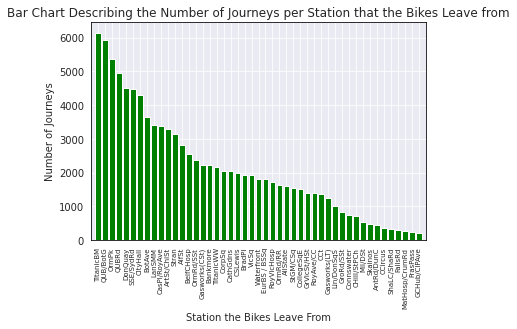

In [18]:
# Plotting popular From Stations 

location = bbikes_df.groupby('station_from')['bike_number'].count().sort_values(ascending=False).plot.bar(color="green", width=0.8)
location.plot(kind="bar", color="green")
plt.xlim([-1,47])
plt.xlabel("Station the Bikes Leave From")
plt.ylabel("Number of Journeys")
plt.title("Bar Chart Describing the Number of Journeys per Station that the Bikes Leave from")
plt.xticks(fontsize=7)
plt.savefig("MostPopStation_FROM_GRID.pdf", bbox_inches='tight', width=1)
plt.show()

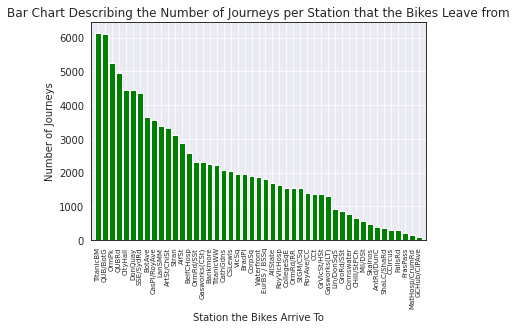

In [19]:
# Plotting popular To Stations 

location2=bbikes_df.groupby('station_to')['bike_number'].count().sort_values(ascending=False).plot.bar(color="green", width=0.8)
location2.plot(kind="bar", color="green")
plt.xlim([-1,47])
plt.xlabel("Station the Bikes Arrive To")
plt.ylabel("Number of Journeys")
plt.title("Bar Chart Describing the Number of Journeys per Station that the Bikes Leave from")
plt.xticks(fontsize=7)
plt.savefig('MostPopStation_TO_GRID.pdf', bbox_inches='tight', width=1)
plt.show()

#Creating Most Popular Time Periods Graphs 

* Creating Original Graph to look at popular time periods \\
* Using all data available in the bbikes data set \\ 
* Led us to using only 2021 so we could have reliable time periods (instead of under the effects of COVID restrictions and less usage) 

In [20]:
# Grouping Time Periods 17:00-18:00 for example

# Changed this for every hour time period and recorded the journeys 
# Used this raw data to input into the graph below

start_time = "17:00:00"
end_time = "18:00:00"
after_start_time = bbikes_df["time_from"] >= start_time
before_end_time = bbikes_df["time_from"] < end_time
between_two_times = after_start_time & before_end_time
Time_17_18 = bbikes_df.loc[between_two_times]
print(Time_17_18)


# Sometimes needed if values were too small it didn't give overall value: 
# Time_17_18['day'].value_counts()

       bike_number station_from  station_to time_from   time_to  \
2            83076     AllState       AlfSt  17:54:47  18:01:47   
3            82974     AllState       AlfSt  17:47:47  17:54:48   
23           83264  ArtSt/ChiSt       AlfSt  17:39:47  17:42:47   
33           82899  ArtSt/ChiSt       AlfSt  17:55:47  17:58:48   
49           83033  ArtSt/ChiSt       AlfSt  17:15:48  17:19:48   
...            ...          ...         ...       ...       ...   
100221      830319    TitanicBM  Waterfront  17:43:47  20:34:48   
100222      830319    TitanicBM  Waterfront  17:43:47  20:34:48   
100243       83321        VicSq  Waterfront  17:02:47  17:07:48   
100244       83321        VicSq  Waterfront  17:02:47  17:07:48   
100246       83076        VicSq  Waterfront  17:52:47  17:58:48   

       trip_time_mins        date    NewDate  year month_short day_short  
2          6.99872675  15/01/2020 2020-01-15  2020         Jan       Wed  
3         7.012683633  26/02/2020 2020-02-26 

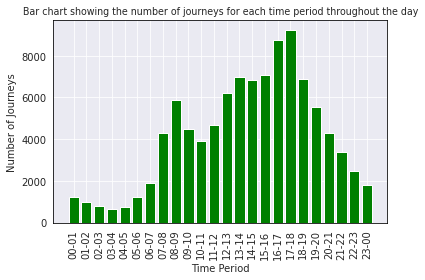

In [21]:
# TIME PERIOD GRAPH DAY 

x=['00-01', '01-02', '02-03', '03-04', '04-05', '05-06', '06-07', '07-08', '08-09', '09-10', '10-11', '11-12', '12-13', '13-14', '14-15', '15-16', '16-17', '17-18', '18-19', '19-20', '20-21', '21-22', '22-23', '23-00']
y=[1251, 977, 785, 658, 761, 1228, 1891, 4299, 5864, 4485, 3901, 4679, 6220, 6974, 6846, 7078, 8756, 9231, 6862, 5545, 4316, 3403, 2477, 1786]
plt.title("Bar chart showing the number of journeys for each time period throughout the day", fontsize=9.5)
plt.bar(x, y, color="green")
plt.xticks(rotation=90)
plt.xlabel("Time Period")
plt.ylabel("Number of Journeys")
plt.tight_layout()
plt.savefig('1journeysinaday_grid.pdf')
plt.show()

In [22]:
# Making day column numbers to group them to weekdays and weekends 
bbikes_df['day'] = bbikes_df['NewDate'].dt.weekday 
print(bbikes_df)

       bike_number station_from  station_to time_from   time_to  \
1            83165     AllState       AlfSt  12:43:47  12:49:48   
2            83076     AllState       AlfSt  17:54:47  18:01:47   
3            82974     AllState       AlfSt  17:47:47  17:54:48   
4            82880     AllState       AlfSt  13:59:47  14:17:48   
5           830397     AllState       AlfSt  08:19:47  08:48:48   
...            ...          ...         ...       ...       ...   
100269       83342        VicSq  Waterfront  18:09:48  20:13:48   
100270       83222        VicSq  Waterfront  18:09:48  20:14:47   
100271       83115        VicSq  Waterfront  18:09:48  20:15:48   
100272      830089        VicSq  Waterfront  11:18:48  13:30:47   
100273      830180        VicSq  Waterfront  15:03:47  18:03:47   

       trip_time_mins        date    NewDate  year month_short day_short  day  
1         6.002286367  15/01/2020 2020-01-15  2020         Jan       Wed    2  
2          6.99872675  15/01/2020 2

In [23]:
# Grouping only 2021 data 

start_date = "2021-01-01"
end_date = "2021-05-03"
after_start_date = bbikes_df["NewDate"] >= start_date
before_end_date = bbikes_df["NewDate"] <= end_date
between_two_dates = after_start_date & before_end_date
print(between_two_dates)
filtered_dates_2021 = bbikes_df.loc[between_two_dates]

print(filtered_dates_2021)

1         False
2         False
3         False
4         False
5          True
          ...  
100269    False
100270    False
100271    False
100272     True
100273     True
Name: NewDate, Length: 100273, dtype: bool
       bike_number station_from  station_to time_from   time_to  \
5           830397     AllState       AlfSt  08:19:47  08:48:48   
7           830276     AllState       AlfSt  16:21:47  16:57:48   
8           830276     AllState       AlfSt  16:21:47  16:57:48   
10          830380     AllState       AlfSt  15:32:47  16:46:48   
11          830014   AntRd/DunC       AlfSt  13:37:47  13:48:48   
...            ...          ...         ...       ...       ...   
100254      830368        VicSq  Waterfront  13:37:47  13:55:48   
100260      830207        VicSq  Waterfront  19:40:47  20:37:54   
100261      830447        VicSq  Waterfront  19:40:47  20:37:54   
100272      830089        VicSq  Waterfront  11:18:48  13:30:47   
100273      830180        VicSq  Waterfront 

In [24]:
# Grouping weekdays 

weekdays_21 = filtered_dates_2021.loc[( filtered_dates_2021['day'] >= 0 ) & ( filtered_dates_2021['day'] < 5 ) ]
print(weekdays_21)


       bike_number station_from  station_to time_from   time_to  \
5           830397     AllState       AlfSt  08:19:47  08:48:48   
7           830276     AllState       AlfSt  16:21:47  16:57:48   
8           830276     AllState       AlfSt  16:21:47  16:57:48   
10          830380     AllState       AlfSt  15:32:47  16:46:48   
11          830014   AntRd/DunC       AlfSt  13:37:47  13:48:48   
...            ...          ...         ...       ...       ...   
100252      830294        VicSq  Waterfront  15:31:47  15:47:49   
100253      830294        VicSq  Waterfront  15:31:47  15:47:49   
100260      830207        VicSq  Waterfront  19:40:47  20:37:54   
100261      830447        VicSq  Waterfront  19:40:47  20:37:54   
100273      830180        VicSq  Waterfront  15:03:47  18:03:47   

       trip_time_mins        date    NewDate  year month_short day_short  day  
5          29.0076709  02/05/2021 2021-02-05  2021         Feb       Fri    4  
7         36.01049578  01/04/2021 2

In [25]:
# Grouping Time Periods 17:00-18:00 for example

# Changed this for every hour time period and recorded the journeys 
# Used this raw data to input into the graph below

start_time = "17:00:00"
end_time = "18:00:00"
after_start_time = weekdays_21["time_from"] >= start_time
before_end_time = weekdays_21["time_from"] < end_time
between_two_times = after_start_time & before_end_time
Time_17_18 = weekdays_21.loc[between_two_times]
print(Time_17_18)


# Sometimes needed if values were too small it didn't give overall value: 
# Time_17_18['day'].value_counts()

       bike_number station_from  station_to time_from   time_to  \
86          830342  ArtSt/ChiSt       AlfSt  17:18:47  17:24:48   
95          830098  ArtSt/ChiSt       AlfSt  17:55:47  18:16:47   
99          830236  ArtSt/ChiSt       AlfSt  17:54:48  18:21:48   
661         830233     Bankmore       AlfSt  17:45:48  19:05:48   
662         830233     Bankmore       AlfSt  17:45:48  19:05:48   
...            ...          ...         ...       ...       ...   
100097      830271        Stran  Waterfront  17:15:47  17:33:47   
100219      830000    TitanicBM  Waterfront  17:44:48  20:34:48   
100220      830000    TitanicBM  Waterfront  17:44:48  20:34:48   
100221      830319    TitanicBM  Waterfront  17:43:47  20:34:48   
100222      830319    TitanicBM  Waterfront  17:43:47  20:34:48   

       trip_time_mins        date    NewDate  year month_short day_short  day  
86          6.0047077  02/05/2021 2021-02-05  2021         Feb       Fri    4  
95        21.00101463  28/04/2021 2

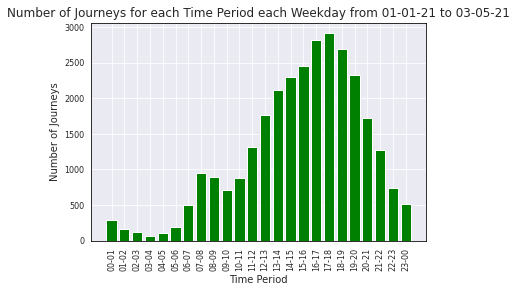

In [26]:
# Weekday Graph 

x=['00-01', '01-02', '02-03', '03-04', '04-05', '05-06', '06-07', '07-08', '08-09', '09-10', '10-11', '11-12', '12-13', '13-14', '14-15', '15-16', '16-17', '17-18', '18-19', '19-20', '20-21', '21-22', '22-23', '23-00']
y=[291, 162, 115, 60, 104, 186, 495, 953, 899, 716, 878, 1311, 1773, 2121, 2295, 2458, 2826, 2914, 2698, 2335, 1719, 1272, 743, 511]
plt.title("Bar chart showing the number of journeys for each time period throughout the day", fontsize=8)
plt.bar(x, y, color="green")
plt.xticks(rotation=90)
plt.xlabel("Time Period")
plt.yticks(fontsize=8)
plt.xticks(fontsize=8)
plt.ylabel("Number of Journeys")
plt.title("Number of Journeys for each Time Period each Weekday from 01-01-21 to 03-05-21")
plt.savefig('1journeysforweekday.pdf')
plt.show()

In [27]:
# Grouping weekends

weekend_21 = filtered_dates_2021.loc[( filtered_dates_2021['day'] >= 5 ) & ( filtered_dates_2021['day'] < 7 ) ]
print(weekend_21)

       bike_number station_from  station_to time_from   time_to  \
12          830176   AntRd/DunC       AlfSt  18:28:48  18:39:48   
13          830176   AntRd/DunC       AlfSt  18:28:48  18:39:48   
56          830340  ArtSt/ChiSt       AlfSt  15:47:47  15:51:47   
69          830200  ArtSt/ChiSt       AlfSt  12:19:47  12:23:48   
77          830016  ArtSt/ChiSt       AlfSt  10:44:48  10:49:47   
...            ...          ...         ...       ...       ...   
100224      830007    TitanicWW  Waterfront  07:59:48  08:04:48   
100233      830382    TitanicWW  Waterfront  18:13:48  19:02:48   
100235      830189        VicSq  Waterfront  13:25:47  13:28:47   
100254      830368        VicSq  Waterfront  13:37:47  13:55:48   
100272      830089        VicSq  Waterfront  11:18:48  13:30:47   

       trip_time_mins        date    NewDate  year month_short day_short  day  
12        11.00442472  28/02/2021 2021-02-28  2021         Feb       Sun    6  
13        11.00442472  28/02/2021 2

In [28]:
# Grouping Time Periods 17:00-18:00 for example

# Changed this for every hour time period and recorded the journeys 
# Used this raw data to input into the graph below

start_time = "17:00:00"
end_time = "18:00:00"
after_start_time = weekend_21["time_from"] >= start_time
before_end_time = weekend_21["time_from"] < end_time
between_two_times = after_start_time & before_end_time
Time_17_18 = weekend_21.loc[between_two_times]
print(Time_17_18)


# Sometimes needed if values were too small it didn't give overall value: 
# Time_17_18['day'].value_counts()

      bike_number    station_from  station_to time_from   time_to  \
1763       830030          LanSMM       AlfSt  17:02:47  17:08:48   
2068       830140           OrmPk       AlfSt  17:03:47  17:14:47   
2805       830033       TitanicBM       AlfSt  17:52:48  18:51:48   
2806       830326       TitanicBM       AlfSt  17:52:48  18:51:48   
2960       830024        Bankmore    AllState  17:38:47  18:04:47   
...           ...             ...         ...       ...       ...   
99487      830085       GroRd/SSt  Waterfront  17:07:48  17:26:47   
99489      830227       GroRd/SSt  Waterfront  17:06:48  17:27:47   
99545      830380  MatHosp/CrumRd  Waterfront  17:27:47  17:28:48   
99765      830056           OrmPk  Waterfront  17:12:48  17:23:48   
99803      830440           OrmPk  Waterfront  17:15:48  18:28:48   

      trip_time_mins        date    NewDate  year month_short day_short  day  
1763     6.003037683  25/04/2021 2021-04-25  2021         Apr       Sun    6  
2068     10.9

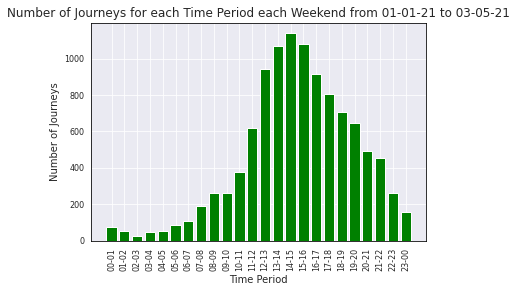

In [29]:
# Weekend Graph 

x=['00-01', '01-02', '02-03', '03-04', '04-05', '05-06', '06-07', '07-08', '08-09', '09-10', '10-11', '11-12', '12-13', '13-14', '14-15', '15-16', '16-17', '17-18', '18-19', '19-20', '20-21', '21-22', '22-23', '23-00']
y=[77, 54, 27, 45, 51, 83, 105, 191, 260, 260, 375, 621, 944, 1068, 1139, 1079, 914, 804, 705, 649, 493, 452, 261, 158]
plt.title("Bar chart showing the number of journeys for each time period throughout the day", fontsize=8)
plt.bar(x, y, color="green")
plt.xticks(rotation=90)
plt.xlabel("Time Period")
plt.yticks(fontsize=8)
plt.xticks(fontsize=8)
plt.ylabel("Number of Journeys")
plt.title("Number of Journeys for each Time Period each Weekend from 01-01-21 to 03-05-21")
plt.savefig('1journeysforweekend.pdf')
plt.show()

Liked both these graphs but decided would look better on one scatter plot: 


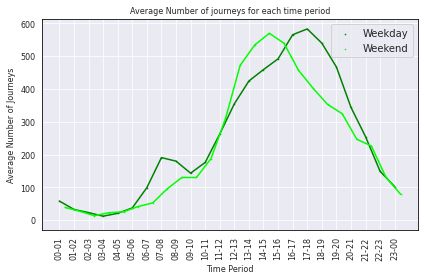

In [30]:
w=0.4
x=['00-01', '01-02', '02-03', '03-04', '04-05', '05-06', '06-07', '07-08', '08-09', '09-10', '10-11', '11-12', '12-13', '13-14', '14-15', '15-16', '16-17', '17-18', '18-19', '19-20', '20-21', '21-22', '22-23', '23-00']
#y1=[291, 162, 115, 60, 104, 186, 495, 953, 899, 716, 878, 1311, 1773, 2121, 2295, 2458, 2826, 2914, 2698, 2335, 1719, 1272, 743, 511]
#y2=[77, 54, 27, 45, 51, 83, 105, 191, 260, 260, 375, 621, 944, 1068, 1139, 1079, 914, 804, 705, 649, 493, 452, 261, 158]

y15=[58.2, 32.5, 23, 12, 20.8, 37.2, 99, 190.6, 179.8, 143.2, 175.8, 262.5, 354.6, 424.2, 459, 491.6, 565.2, 582.8, 539.6, 467, 343.8, 254.4, 148.6, 102.2]
y22=[38.5, 27, 13.5, 22.5, 25.5, 41.5, 52.5, 95.5, 130, 130, 187.5, 310.5, 472, 534, 569.5, 539.5, 457, 402, 352.5, 324.5, 246.5, 226, 130.5, 79]
bar1 = np.arange(len(x))
bar2 = [i+w for i in bar1]

plt.plot(x, y15, w, color="green")
plt.plot(bar2, y22, w, color="lime")
plt.scatter(x, y15, w, label="Weekday",color="green")
plt.scatter(bar2, y22, w, label="Weekend",color="lime")

plt.xlabel("Time Period", fontsize=8)
plt.ylabel("Average Number of Journeys", fontsize = 8)
plt.yticks(fontsize=8)
plt.xticks(fontsize=8)
plt.title("Average Number of journeys for each time period", fontsize=8)
plt.xticks(rotation=90, fontsize=8)
plt.legend()
plt.tight_layout()
plt.savefig('TimePeriodGraph.pdf', bboxes_inches='tight', width=0.5)
plt.show()

#Making Rush Hour Graph for All Data 


Decided to use all bbikes_df data here as the morning/evening rush hours were looked at throughout as much data as possible. 

In [31]:
# Grouping bikes going to the City - for morning
to_city_bikes = bbikes_df.loc[(bbikes_df["station_to"].str.startswith('AlfSt')) + (bbikes_df["station_to"].str.startswith('AllState')) +
                           (bbikes_df["station_to"].str.startswith('ArtSt')) + (bbikes_df["station_to"].str.startswith('Bankmore')) + 
                           (bbikes_df["station_to"].str.startswith('CasPl')) + (bbikes_df["station_to"].str.startswith('CathGdns')) + 
                           (bbikes_df["station_to"].str.startswith('CCt')) + (bbikes_df["station_to"].str.startswith('CityHall')) + 
                           (bbikes_df["station_to"].str.startswith('CollegeSq')) + (bbikes_df["station_to"].str.startswith('DonQuay')) + 
                           (bbikes_df["station_to"].str.startswith('EurBS')) + (bbikes_df["station_to"].str.startswith('Gasworks')) + 
                           (bbikes_df["station_to"].str.startswith('GrVicSt')) + (bbikes_df["station_to"].str.startswith('Lans'))+ 
                           (bbikes_df["station_to"].str.startswith('Lin')) + (bbikes_df["station_to"].str.startswith('MilDSt')) + 
                           (bbikes_df["station_to"].str.startswith('RoyAve')) + (bbikes_df["station_to"].str.startswith('StGM')) + 
                           (bbikes_df["station_to"].str.startswith('VicSq')) + (bbikes_df["station_to"].str.startswith('Waterfront'))]
print(to_city_bikes) # 47 stations 

       bike_number station_from  station_to time_from   time_to  \
1            83165     AllState       AlfSt  12:43:47  12:49:48   
2            83076     AllState       AlfSt  17:54:47  18:01:47   
3            82974     AllState       AlfSt  17:47:47  17:54:48   
4            82880     AllState       AlfSt  13:59:47  14:17:48   
5           830397     AllState       AlfSt  08:19:47  08:48:48   
...            ...          ...         ...       ...       ...   
100269       83342        VicSq  Waterfront  18:09:48  20:13:48   
100270       83222        VicSq  Waterfront  18:09:48  20:14:47   
100271       83115        VicSq  Waterfront  18:09:48  20:15:48   
100272      830089        VicSq  Waterfront  11:18:48  13:30:47   
100273      830180        VicSq  Waterfront  15:03:47  18:03:47   

       trip_time_mins        date    NewDate  year month_short day_short  day  
1         6.002286367  15/01/2020 2020-01-15  2020         Jan       Wed    2  
2          6.99872675  15/01/2020 2

In [32]:
# Grouping bikes coming from the city - for evening
from_city_bikes = bbikes_df.loc[(bbikes_df["station_from"].str.startswith('AlfSt')) + (bbikes_df["station_from"].str.startswith('AllState')) +
                           (bbikes_df["station_from"].str.startswith('ArtSt')) + (bbikes_df["station_from"].str.startswith('Bankmore')) + 
                           (bbikes_df["station_from"].str.startswith('CasPl')) + (bbikes_df["station_from"].str.startswith('CathGdns')) + 
                           (bbikes_df["station_from"].str.startswith('CCt')) + (bbikes_df["station_from"].str.startswith('CityHall')) + 
                           (bbikes_df["station_from"].str.startswith('CollegeSq')) + (bbikes_df["station_from"].str.startswith('DonQuay')) + 
                           (bbikes_df["station_from"].str.startswith('EurBS')) + (bbikes_df["station_from"].str.startswith('Gasworks')) + 
                           (bbikes_df["station_from"].str.startswith('GrVicSt')) + (bbikes_df["station_from"].str.startswith('Lans'))+ 
                           (bbikes_df["station_from"].str.startswith('Lin')) + (bbikes_df["station_from"].str.startswith('MilDSt')) + 
                           (bbikes_df["station_from"].str.startswith('RoyAve')) + (bbikes_df["station_from"].str.startswith('StGM')) + 
                           (bbikes_df["station_from"].str.startswith('VicSq')) + (bbikes_df["station_from"].str.startswith('Waterfront'))]
print(from_city_bikes) # 47 stations 

       bike_number station_from  station_to time_from   time_to  \
1            83165     AllState       AlfSt  12:43:47  12:49:48   
2            83076     AllState       AlfSt  17:54:47  18:01:47   
3            82974     AllState       AlfSt  17:47:47  17:54:48   
4            82880     AllState       AlfSt  13:59:47  14:17:48   
5           830397     AllState       AlfSt  08:19:47  08:48:48   
...            ...          ...         ...       ...       ...   
100269       83342        VicSq  Waterfront  18:09:48  20:13:48   
100270       83222        VicSq  Waterfront  18:09:48  20:14:47   
100271       83115        VicSq  Waterfront  18:09:48  20:15:48   
100272      830089        VicSq  Waterfront  11:18:48  13:30:47   
100273      830180        VicSq  Waterfront  15:03:47  18:03:47   

       trip_time_mins        date    NewDate  year month_short day_short  day  
1         6.002286367  15/01/2020 2020-01-15  2020         Jan       Wed    2  
2          6.99872675  15/01/2020 2

In [33]:
# Grouping Morning Time Period 06:00-10:00 for bikes going to the city 
# Changed time slots for every hour between 6 and 10

start_time = "06:00:00"
end_time = "07:00:00"
after_start_time = to_city_bikes["time_to"] >= start_time
before_end_time = to_city_bikes["time_to"] < end_time
between_two_times = after_start_time & before_end_time
Time_Morn0 = to_city_bikes.loc[between_two_times]
print(Time_Morn0)

      bike_number  station_from  station_to time_from   time_to  \
126         83434      Bankmore       AlfSt  06:00:48  06:01:47   
138         83434      Bankmore       AlfSt  06:00:47  06:01:47   
156         83434      Bankmore       AlfSt  06:35:47  06:36:47   
183         83434      Bankmore       AlfSt  06:35:47  06:36:47   
204         83434      Bankmore       AlfSt  06:30:47  06:31:47   
...           ...           ...         ...       ...       ...   
99315       83099  EurBS / BSSq  Waterfront  06:27:47  06:33:47   
99553      830053       Mil/DSt  Waterfront  04:54:47  06:20:47   
99554      830387       Mil/DSt  Waterfront  04:50:48  06:18:47   
99784       83349         OrmPk  Waterfront  06:43:48  06:59:48   
99944      830285         QUBRd  Waterfront  06:27:47  06:40:48   

      trip_time_mins        date    NewDate  year month_short day_short  day  
126        0.9966814  24/11/2020 2020-11-24  2020         Nov       Tue    1  
138      0.997017083  23/11/2020 2020

In [34]:
# Grouping Morning Time Period 06:00-10:00 for bikes coming from the city 
# Changed time slots for every hour between 6 and 10

start_time = "06:00:00"
end_time = "07:00:00"
after_start_time = from_city_bikes["time_from"] >= start_time
before_end_time = from_city_bikes["time_from"] < end_time
between_two_times = after_start_time & before_end_time
Time_Morn0 = from_city_bikes.loc[between_two_times]
print(Time_Morn0)

      bike_number  station_from  station_to time_from   time_to  \
126         83434      Bankmore       AlfSt  06:00:48  06:01:47   
138         83434      Bankmore       AlfSt  06:00:47  06:01:47   
156         83434      Bankmore       AlfSt  06:35:47  06:36:47   
183         83434      Bankmore       AlfSt  06:35:47  06:36:47   
204         83434      Bankmore       AlfSt  06:30:47  06:31:47   
...           ...           ...         ...       ...       ...   
97933       83115      StGM/CSq       VicSq  06:19:47  06:22:47   
97935       83061      StGM/CSq       VicSq  06:35:47  06:38:48   
97937       83000      StGM/CSq       VicSq  06:38:47  06:41:47   
99168      830270       DonQuay  Waterfront  06:35:49  06:39:48   
99315       83099  EurBS / BSSq  Waterfront  06:27:47  06:33:47   

      trip_time_mins        date    NewDate  year month_short day_short  day  
126        0.9966814  24/11/2020 2020-11-24  2020         Nov       Tue    1  
138      0.997017083  23/11/2020 2020

In [35]:
# Grouping Evening Time Period 15:00-19:00 for bikes going to the city 
# Changed time slots for every hour between 3 and 7

start_time = "15:00:00"
end_time = "16:00:00"
after_start_time = to_city_bikes["time_to"] >= start_time
before_end_time = to_city_bikes["time_to"] < end_time
between_two_times = after_start_time & before_end_time
Time_Eve1 = to_city_bikes.loc[between_two_times]
print(Time_Eve1)

       bike_number station_from  station_to time_from   time_to  \
6            83290     AllState       AlfSt  15:19:47  15:55:47   
17           82833  ArtSt/ChiSt       AlfSt  15:37:48  15:40:47   
18           82833  ArtSt/ChiSt       AlfSt  15:37:48  15:40:47   
24           82841  ArtSt/ChiSt       AlfSt  15:14:48  15:17:48   
26           82889  ArtSt/ChiSt       AlfSt  15:09:47  15:12:47   
...            ...          ...         ...       ...       ...   
100251       83122        VicSq  Waterfront  15:20:48  15:33:48   
100252      830294        VicSq  Waterfront  15:31:47  15:47:49   
100253      830294        VicSq  Waterfront  15:31:47  15:47:49   
100257       83048        VicSq  Waterfront  15:04:48  15:47:47   
100258       83349        VicSq  Waterfront  15:00:47  15:47:47   

       trip_time_mins        date    NewDate  year month_short day_short  day  
6          36.0007503  30/12/2019 2019-12-30  2019         Dec       Mon    0  
17        2.985395667  02/08/2020 2

In [36]:
# Grouping Evening Time Period 15:00-19:00 for bikes coming from the city
# Changed time slots for every hour between 3 and 7

start_time = "15:00:00"
end_time = "16:00:00"
after_start_time = to_city_bikes["time_from"] >= start_time
before_end_time = to_city_bikes["time_from"] < end_time
between_two_times = after_start_time & before_end_time
Time_Eve1 = to_city_bikes.loc[between_two_times]
print(Time_Eve1)

       bike_number station_from  station_to time_from   time_to  \
6            83290     AllState       AlfSt  15:19:47  15:55:47   
10          830380     AllState       AlfSt  15:32:47  16:46:48   
17           82833  ArtSt/ChiSt       AlfSt  15:37:48  15:40:47   
18           82833  ArtSt/ChiSt       AlfSt  15:37:48  15:40:47   
24           82841  ArtSt/ChiSt       AlfSt  15:14:48  15:17:48   
...            ...          ...         ...       ...       ...   
100262      830303        VicSq  Waterfront  15:39:47  16:37:48   
100264      830031        VicSq  Waterfront  15:47:48  16:54:48   
100265      830411        VicSq  Waterfront  15:44:47  16:53:48   
100266      830158        VicSq  Waterfront  15:43:47  16:53:48   
100273      830180        VicSq  Waterfront  15:03:47  18:03:47   

       trip_time_mins        date    NewDate  year month_short day_short  day  
6          36.0007503  30/12/2019 2019-12-30  2019         Dec       Mon    0  
10        74.00660972  21/04/2021 2

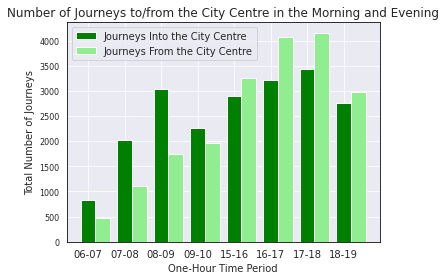

In [37]:
# Using all raw data found above plotting morning and evening rush-hour graph

import numpy as np
from matplotlib import pyplot as plt
import pandas as pd 
import seaborn as sns
from datetime import date

w=0.4
x = ['06-07', '07-08', '08-09', '09-10','15-16', '16-17', '17-18', '18-19']
journeysto =[837, 2027, 3040, 2256, 2889,3209,3428,2764]
journeysfrom =[475, 1107, 1751, 1966,3249, 4080, 4153, 2971]

bar1 = np.arange(len(x))
bar2 = [i+w for i in bar1]

plt.bar(x, journeysto, w, label="Journeys Into the City Centre",color="green")
plt.bar(bar2, journeysfrom, w, label="Journeys From the City Centre",color="lightgreen")

plt.xlabel("One-Hour Time Period")
plt.ylabel("Total Number of Journeys")
plt.yticks(fontsize=8)
plt.title("Number of Journeys to/from the City Centre in the Morning and Evening")
plt.xticks()
plt.legend()
plt.tight_layout()
plt.savefig('Morn_Eve.pdf')
plt.show()

#Creating Unique Station Route Chessboard 

In [38]:
# How many stations from and to 
num_df = bbikes_df.groupby('station_from')
num_df = num_df.agg({'station_to':"nunique"})
print(num_df)

# Grouping by both the starting and end stations
unique_df = bbikes_df.groupby(['station_from', 'station_to']).agg(['count'])
print(unique_df)

# used previously for observing : 
#unique_df['bike_number'].value_counts()

#unique_df.to_csv('Bike_Data.csv', index=False)

# Plot the count column 
#unique_df.plot(x='station_from', y=["station_to", "bike_number"])
#plt.show()

                station_to
station_from              
AlfSt                   43
AllState                41
AntRd/DunC              43
ArtSt/ChiSt             44
Bankmore                43
BelfCHosp               45
BotAve                  46
BradPl                  42
CCircus                 40
CCt                     45
CHill/StPCh             43
CSLewis                 46
CasPl/RoyAve            46
CathGdns                45
CityHall                46
CollegeSqE              43
Connswater              43
CorpSq                  41
DonQuay                 44
EurBS / BSSq            44
FallsRd                 36
FrasPass                36
GCHub/ClPAve            37
Gasworks(CSt)           43
Gasworks(LT)            40
GrVicSt/HSt             44
GroRd/SSt               42
LanSMM                  43
Lin/DonSqS              44
MatHosp/CrumRd          39
Mil/DSt                 43
OrmPk                   45
OrmRd/RR                40
OrmRd/SSt               44
QUB/BotG                46
Q

In [39]:
# First attempt of chessboard, ordered through distance-based (NOT IN USE!!) 

# making DRAFT crosstable 
table = pd.crosstab(bbikes_df.station_from, bbikes_df.station_to)
table

#colouring table 
table.style.background_gradient(cmap='RdYlGn')


station_to,AlfSt,AllState,AntRd/DunC,ArtSt/ChiSt,Bankmore,BelfCHosp,BotAve,BradPl,CCircus,CCt,CHill/StPCh,CSLewis,CasPl/RoyAve,CathGdns,CityHall,CollegeSqE,Connswater,CorpSq,DonQuay,EurBS / BSSq,FallsRd,FrasPass,GCHub/ClPAve,Gasworks(CSt),Gasworks(LT),GrVicSt/HSt,GroRd/SSt,LanSMM,Lin/DonSqS,MatHosp/CrumRd,Mil/DSt,OrmPk,OrmRd/RR,OrmRd/SSt,QUB/BotG,QUBRd,RoyAve/CC,RoyVicHosp,SSE/SydRd,ShaLC/ShaRd,Skainos,StGM/CSq,Stran,TitanicBM,TitanicWW,VicSq,Waterfront
station_from,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AlfSt,0,5,0,78,584,44,118,317,1,38,9,27,74,28,21,22,10,109,61,10,1,3,0,78,33,4,19,55,28,1,2,165,65,85,69,63,91,1,186,0,13,15,97,157,17,14,11
AllState,10,0,2,13,67,31,40,23,1,11,7,25,7,12,20,4,58,22,69,2,0,1,0,78,82,5,0,108,7,0,5,192,26,67,159,46,7,30,55,0,1,123,108,44,13,19,15
AntRd/DunC,5,0,0,36,16,19,7,1,16,27,33,10,11,17,23,7,1,3,4,19,1,0,14,2,0,16,2,3,10,9,2,12,6,7,8,3,15,8,14,3,1,8,1,19,5,9,3
ArtSt/ChiSt,103,20,6,0,96,49,182,57,2,19,22,82,43,52,55,29,21,107,85,20,8,0,0,64,45,20,19,34,19,7,19,298,26,167,152,896,42,4,94,4,15,8,97,125,24,22,32
Bankmore,544,72,2,103,0,90,94,47,2,29,4,22,56,54,72,8,7,14,48,11,1,6,0,58,6,19,5,37,19,0,6,70,14,40,216,110,24,8,90,0,4,32,60,59,14,20,28
BelfCHosp,48,26,16,78,36,0,74,98,9,46,37,37,90,63,294,84,12,22,72,38,3,5,3,9,14,236,15,11,32,4,32,273,11,34,175,165,40,20,27,25,0,25,43,59,32,29,35
BotAve,151,73,5,175,95,123,0,115,7,61,11,54,157,114,272,118,8,50,130,18,9,8,6,79,19,62,18,45,46,1,30,145,13,66,382,146,43,13,366,8,8,69,81,149,18,26,47
BradPl,335,25,3,53,42,103,87,0,20,26,14,16,61,39,155,68,2,24,64,23,0,0,0,12,9,79,22,27,12,1,15,37,15,30,152,150,22,7,16,0,1,14,47,59,7,18,29
CCircus,3,1,15,2,2,8,8,6,0,3,34,2,15,7,18,7,0,5,6,8,1,0,2,0,4,8,3,18,0,10,14,14,2,5,14,6,14,20,3,19,1,0,3,7,0,3,27


In [40]:
# DID NOT USE 

# ORDER OF DISTANCE : found through plotting centre on map and calculating distance 
# between this and all locations (not included as we did not end up using this figure)

correctorder=[ 'ArtSt/ChiSt',    
'AlfSt',
'Lin/DonSqS',
'CityHall',
'StGM/CSq',
'VicSq',
'Waterfront',
'CasPl/RoyAve',
'EurBS / BSSq',
'Gasworks(CSt)',
'Bankmore',
'CollegeSqE',
'GrVicSt/HSt',
'CCt',
'RoyAve/CC',
'Gasworks(LT)',
'DonQuay',
'Mil/DSt',
'LanSMM',
'AllState',
'CathGdns',
'BotAve',
'CorpSq',
'CHill/StPCh',
'SSE/SydRd',
'BradPl',
'FallsRd',
'BelfCHosp',
'QUB/BotG',
'GroRd/SSt',
'FrasPass',
'ShaLC/ShaRd',
'CCircus',
'QUBRd',
'TitanicBM',
'MatHosp/CrumRd',   
'Skainos',
'OrmPk',
'AntRd/DunC',
'GCHub/ClPAve',
'OrmRd/SSt',
'RoyVicHosp',
'Connswater',
'CSLewis',
'TitanicWW',
'Stran', 
'OrmRd/RR']  # stations ordered closest to farthest

table = table[correctorder]
table = table.reindex(correctorder)
table

#colouring table 
table.style.background_gradient(cmap='RdYlGn')

station_to,ArtSt/ChiSt,AlfSt,Lin/DonSqS,CityHall,StGM/CSq,VicSq,Waterfront,CasPl/RoyAve,EurBS / BSSq,Gasworks(CSt),Bankmore,CollegeSqE,GrVicSt/HSt,CCt,RoyAve/CC,Gasworks(LT),DonQuay,Mil/DSt,LanSMM,AllState,CathGdns,BotAve,CorpSq,CHill/StPCh,SSE/SydRd,BradPl,FallsRd,BelfCHosp,QUB/BotG,GroRd/SSt,FrasPass,ShaLC/ShaRd,CCircus,QUBRd,TitanicBM,MatHosp/CrumRd,Skainos,OrmPk,AntRd/DunC,GCHub/ClPAve,OrmRd/SSt,RoyVicHosp,Connswater,CSLewis,TitanicWW,Stran,OrmRd/RR
station_from,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ArtSt/ChiSt,0,103,19,55,8,22,32,43,20,64,96,29,20,19,42,45,85,19,34,20,52,182,107,22,94,57,8,49,152,19,0,4,2,896,125,7,15,298,6,0,167,4,21,82,24,97,26
AlfSt,78,0,28,21,15,14,11,74,10,78,584,22,4,38,91,33,61,2,55,5,28,118,109,9,186,317,1,44,69,19,3,0,1,63,157,1,13,165,0,0,85,1,10,27,17,97,65
Lin/DonSqS,30,15,0,28,11,3,9,38,13,26,32,11,3,9,19,48,47,3,31,8,18,73,44,4,12,31,2,49,50,11,1,0,2,65,41,1,6,90,2,0,22,4,8,10,7,23,39
CityHall,98,31,35,0,426,37,60,174,55,51,106,87,41,60,48,29,242,30,58,22,106,203,35,20,118,127,16,209,444,20,8,14,11,275,187,6,11,181,9,1,111,206,21,72,53,99,55
StGM/CSq,10,29,4,446,0,39,27,31,58,65,21,8,7,3,9,17,25,1,17,114,11,50,21,2,27,21,1,14,45,6,1,0,0,40,44,1,0,74,2,0,82,66,7,50,5,33,13
VicSq,26,12,14,37,24,0,40,21,16,37,16,5,15,12,3,32,74,5,38,14,40,22,50,8,418,15,5,23,76,4,9,2,4,38,362,5,4,110,6,0,70,52,14,41,22,67,7
Waterfront,20,23,15,42,17,22,0,74,19,14,36,40,31,15,13,22,152,17,36,17,25,35,117,12,101,10,0,64,93,1,23,2,23,29,118,2,22,160,0,1,60,1,47,128,16,84,15
CasPl/RoyAve,48,73,17,154,26,20,34,0,48,50,69,70,65,63,108,18,145,54,177,20,87,182,65,66,183,48,25,86,235,20,7,20,6,138,261,13,14,194,16,3,64,25,10,62,70,167,50
EurBS / BSSq,17,22,12,44,63,2,32,35,0,25,10,16,20,16,30,16,87,1,22,2,40,28,67,2,33,18,3,54,62,12,1,1,4,40,155,0,2,58,4,0,28,619,8,4,20,48,19


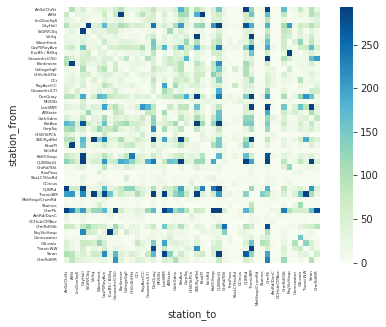

In [41]:
# DID NOT USE 

# plotting distance-based chessboard 

plt.xticks(fontsize=4)
plt.yticks(fontsize=4)
plt.axis('square')
plt.tight_layout()
sns.heatmap(table, annot=False, robust=True, cmap='GnBu')
plt.savefig('Chessboard.pdf')

In [42]:
# Chessboard we ended up using in preferance to the distance-based

# ORDER OF MOST POPULAR FROM STATION

correctorder2=[ 'TitanicBM',
'QUB/BotG',
'OrmPk',
'QUBRd',
'DonQuay',
'SSE/SydRd',
'CityHall',
'BotAve',
'LanSMM',
'CasPl/RoyAve',
'ArtSt/ChiSt',
'Stran',
'AlfSt',
'BelfCHosp',
'OrmRd/SSt',
'Gasworks(CSt)',
'Bankmore' ,
'TitanicWW',         
'CorpSq',            
'CathGdns',          
'CSLewis'  ,         
'BradPl'    ,        
'VicSq'      ,       
'Waterfront'  ,      
'EurBS / BSSq' ,     
'RoyVicHosp'    ,    
'OrmRd/RR'       ,   
'AllState'        ,  
'StGM/CSq'         , 
'CollegeSqE'        ,
'GrVicSt/HSt'       ,
'RoyAve/CC'         ,
'CCt'               ,
'Gasworks(LT)'      ,
'Lin/DonSqS'         ,
'GroRd/SSt'          ,
'Connswater'         ,
'CHill/StPCh'        ,
'Mil/DSt'            ,
'Skainos'            ,
'AntRd/DunC'         ,
'CCircus'            ,
'ShaLC/ShaRd'        ,
'FallsRd'            ,
'MatHosp/CrumRd'     ,
'FrasPass'           ,
'GCHub/ClPAve'       ]  # stations ordered in popularity of use

table2 = table[correctorder2]
table2 = table2.reindex(correctorder2)
table2

#colouring table 
table2.style.background_gradient(cmap='RdYlGn')

station_to,TitanicBM,QUB/BotG,OrmPk,QUBRd,DonQuay,SSE/SydRd,CityHall,BotAve,LanSMM,CasPl/RoyAve,ArtSt/ChiSt,Stran,AlfSt,BelfCHosp,OrmRd/SSt,Gasworks(CSt),Bankmore,TitanicWW,CorpSq,CathGdns,CSLewis,BradPl,VicSq,Waterfront,EurBS / BSSq,RoyVicHosp,OrmRd/RR,AllState,StGM/CSq,CollegeSqE,GrVicSt/HSt,RoyAve/CC,CCt,Gasworks(LT),Lin/DonSqS,GroRd/SSt,Connswater,CHill/StPCh,Mil/DSt,Skainos,AntRd/DunC,CCircus,ShaLC/ShaRd,FallsRd,MatHosp/CrumRd,FrasPass,GCHub/ClPAve
station_from,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
TitanicBM,0,203,113,135,550,741,223,161,460,283,201,105,207,66,57,32,73,871,77,126,149,48,337,83,155,10,20,52,27,41,34,49,104,14,21,16,48,6,29,142,17,6,4,15,4,24,7
QUB/BotG,197,0,392,1037,237,121,420,494,80,209,134,335,95,194,85,79,192,30,57,150,85,118,54,58,63,10,49,163,32,178,129,43,68,184,44,22,23,31,6,9,1,4,3,17,3,3,1
OrmPk,110,388,0,178,170,75,203,153,341,175,313,164,231,308,234,353,70,58,91,111,55,59,122,124,35,103,279,238,64,23,21,28,44,120,130,59,53,12,11,4,16,8,1,1,0,6,15
QUBRd,119,975,179,0,95,93,285,197,64,164,843,209,67,238,85,43,76,15,31,102,51,229,27,28,29,17,48,65,18,132,133,37,56,18,68,22,27,14,11,7,5,4,2,6,9,0,1
DonQuay,826,237,201,139,0,398,193,106,71,161,90,160,89,50,105,55,57,213,188,102,129,60,66,176,84,8,18,66,12,50,24,33,51,41,45,8,26,46,40,26,1,9,8,13,0,26,0
SSE/SydRd,786,143,81,110,396,0,174,392,196,232,95,76,100,38,31,43,105,190,77,67,67,23,446,134,39,7,45,36,21,26,23,36,64,18,14,6,21,9,31,9,5,11,18,18,1,6,3
CityHall,187,444,181,275,242,118,0,203,58,174,98,99,31,209,111,51,106,53,35,106,72,127,37,60,55,206,55,22,426,87,41,48,60,29,35,20,21,20,30,11,9,11,14,16,6,8,1
BotAve,149,382,145,146,130,366,272,0,45,157,175,81,151,123,66,79,95,18,50,114,54,115,26,47,18,13,13,73,69,118,62,43,61,19,46,18,8,11,30,8,5,7,8,9,1,8,6
LanSMM,486,86,294,51,85,159,64,85,0,201,39,321,27,26,155,95,39,89,85,21,159,22,44,41,57,5,36,74,18,8,15,208,52,177,22,5,45,4,3,5,7,3,1,1,0,0,0


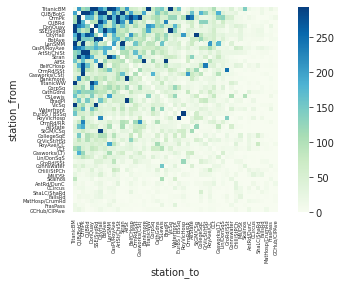

In [43]:
# plotting popularity-based chessboard 

plt.xticks(fontsize=5)
plt.yticks(fontsize=5)
plt.axis('square')
plt.tight_layout()
sns_plot = sns.heatmap(table2, annot=False, robust=True, cmap='GnBu')
plt.gcf().subplots_adjust(bottom=0.25)
sns_plot.figure.savefig("chess2.png")

#Creating Map of Station Locations

In [44]:
import pandas as pd
import numpy as np
import folium
import csv 

# upload data with latitude and longitude 
from google.colab import files
uploaded = files.upload()

Saving belfast-bike-stations-updated-25-june-2021.csv to belfast-bike-stations-updated-25-june-2021.csv


In [46]:
#read in csv using pandas 
bike_station_locations = pd.read_csv('belfast-bike-stations-updated-25-june-2021.csv')

# only keep necessary columns 
bike_station_locations = bike_station_locations[["Location","Latitude", "Longitude"]]
bike_station_locations

,Location,Latitude,Longitude
0,City Hall,54.597000,-5.929950
1,Victoria Square/Victoria Street,54.598200,-5.923090
2,Donegall Quay,54.601500,-5.921040
3,Lanyon Station/Mays Meadow,54.595200,-5.915450
4,St George's Market/Cromac Square,54.595100,-5.922430
5,Gasworks (Cromac Street),54.592100,-5.924500
6,Belfast Waterfront/Lanyon Place,54.597100,-5.920080
7,Botanic Avenue/Shaftesbury Square,54.589200,-5.932400
8,Europa Bus Station/Blackstaff Square,54.594800,-5.932230
9,Great Victoria Street/Hope Street,54.593400,-5.933380


In [47]:
# set initial map 
map = folium.Map(location=[bike_station_locations.Latitude.mean(), bike_station_locations.Longitude.mean()],
zoom_start=13.3, control_scale=True)
map

In [48]:
 # create markers on map of each station 
 
for index, location_info in bike_station_locations.iterrows():
  location = [location_info["Latitude"], location_info["Longitude"]]
  folium.Marker(location, popup=location_info["Location"]).add_to(map)
map.save('mymap.html')
map

In [49]:
# Creating new locations ideas

#Malone Road Elms Village

elms = [54.5760658, -5.9423107]
folium.Marker(elms, popup='New Location', icon = folium.Icon(color='red', icon='1')).add_to(map)

folium.Circle(
    radius=500,
    location=[54.5760658, -5.9423107],
    popup="Elms Student Village",
    color="red",
    fill=True).add_to(map)
map

# Titanic Hotel
ti = [54.6080, -5.9081]
folium.Marker(ti, popup='New Location', icon = folium.Icon(color='green', icon='2')).add_to(map)

folium.Circle(
    radius=500,
    location=[54.6080, -5.9081],
    popup="Titanic Hotel",
    color="green",
    fill=True).add_to(map)
map

# Ormeau Park Playground
park = [54.5895, -5.9114]
folium.Marker(park, popup='New Location', icon = folium.Icon(color='purple', icon='3')).add_to(map)

folium.Circle(
    radius=500,
    location=[54.5895, -5.9114],
    popup="Ormeau Park Playground",
    color="purple",
    fill=True).add_to(map)

map.save('mymap2.html')
map

#Creating Popular Station Map

In [50]:
# set initial map for population analysis
map2 = folium.Map(location=[bike_station_locations.Latitude.mean(), bike_station_locations.Longitude.mean()],
zoom_start=13.3, control_scale=True)
map2

In [54]:
# Station Journeys:

# >6000
six = [54.6055,	-5.90997] #1 Titanic Belfast MET 
folium.Marker(six, popup='>6000', icon = folium.Icon(color='darkred', icon='1')).add_to(map2)

# 5000-6000
five = [54.5841,	-5.93188] #2 Queen's University/Botanic Gardens
folium.Marker(five, popup='5000-6000', icon = folium.Icon(color='red', icon='2')).add_to(map2)

fiv  = [54.5806,	-5.9205] #3 Ormeau Park
folium.Marker(fiv, popup='5000-6000', icon = folium.Icon(color='red', icon='2')).add_to(map2)

# 4000-5000
four = [54.5844, -5.93578] #4 Queen's University/University Road
folium.Marker(four, popup='4000-5000', icon = folium.Icon(color='orange', icon='1')).add_to(map2)

fou=        [54.6015,	-5.92104] #5 Donegall Quay
folium.Marker(fou, popup='4000-5000', icon = folium.Icon(color='orange', icon='1')).add_to(map2)

fo=        [54.6038,	-5.9162]  #6 Odyssey/Sydenham Road 
folium.Marker(fo, popup='4000-5000', icon = folium.Icon(color='orange', icon='1')).add_to(map2)  

f=        [54.597,	-5.92995] #7 City Hall
folium.Marker(f, popup='4000-5000', icon = folium.Icon(color='orange', icon='1')).add_to(map2)

# 3000-4000
three = [54.5892,	-5.9324]  #8 Botanic Avenue/Shaftesbury Square 
folium.Marker(three, popup='3000-4000', icon = folium.Icon(color='green', icon='1')).add_to(map2)         

thre =        [54.5952,	-5.91545] #9 Lanyon Station/Mays Meadow
folium.Marker(thre, popup='3000-4000', icon = folium.Icon(color='green', icon='1')).add_to(map2)

thr  =       [54.5994,	-5.92959] #10 Castle Place/Royal Avenue
folium.Marker(thr, popup='3000-4000', icon = folium.Icon(color='green', icon='1')).add_to(map2)

th =        [54.5975,	-5.92655] #11 Arthur Street/Chichester Street
folium.Marker(th, popup='3000-4000', icon = folium.Icon(color='green', icon='1')).add_to(map2)

t =        [54.5749,	-5.93213] #12 Stranmillis
folium.Marker(t, popup='3000-4000', icon = folium.Icon(color='green', icon='1')).add_to(map2)

# 2000-3000         
two =  [54.5948,	-5.92642] #13 Alfred Street/St Malachy's Church 
folium.Marker(two, popup='2000-3000', icon = folium.Icon(color='blue', icon='1')).add_to(map2)

twop=        [54.587,	-5.93824] #14 Belfast City Hospital (Lisburn Road)
folium.Marker(twop, popup='2000-3000', icon = folium.Icon(color='blue', icon='1')).add_to(map2)

twoq    =    [54.5781,	-5.918787]#15 Ormeau Road/Somerset Street
folium.Marker(twoq, popup='2000-3000', icon = folium.Icon(color='blue', icon='1')).add_to(map2)

twok     =   [54.5921,	-5.9245]  #16 Gasworks (Cromac Street) 
folium.Marker(twok, popup='2000-3000', icon = folium.Icon(color='blue', icon='1')).add_to(map2)

twoj =       [54.5925,	-5.93026] #17 Bankmore Square/Dublin Road 
folium.Marker(twoj, popup='2000-3000', icon = folium.Icon(color='blue', icon='1')).add_to(map2)

twof=        [54.6119,	-5.90281] #18 Titanic Walkway
folium.Marker(twof, popup='2000-3000', icon = folium.Icon(color='blue', icon='1')).add_to(map2)

twos =       [54.6048,	-5.92041] #19 Corporation Square
folium.Marker(twos, popup='2000-3000', icon = folium.Icon(color='blue', icon='1')).add_to(map2)

twoa  =     [54.6036,	-5.92842] #20 Cathedral Gardens/York Street
folium.Marker(twoa, popup='2000-3000', icon = folium.Icon(color='blue', icon='1')).add_to(map2)

# 1000-2000
one =   [54.5982,	-5.891]   #21 C S Lewis Square
folium.Marker(one, popup='1000-2000', icon = folium.Icon(color='purple', icon='1')).add_to(map2)

onea=        [54.588,	-5.93448] #22 Bradbury Place
folium.Marker(onea, popup='1000-2000', icon = folium.Icon(color='purple', icon='1')).add_to(map2)

oneb =       [54.5982,	-5.92309] #23 Victoria Square/Victoria Street
folium.Marker(oneb, popup='1000-2000', icon = folium.Icon(color='purple', icon='1')).add_to(map2)

onec  =      [54.5971,	-5.92008] #24 Belfast Waterfront/Lanyon Place
folium.Marker(onec, popup='1000-2000', icon = folium.Icon(color='purple', icon='1')).add_to(map2)

oned   =     [54.5948,	-5.93223] #25 Europa Bus Station/Blackstaff Square
folium.Marker(oned, popup='1000-2000', icon = folium.Icon(color='purple', icon='1')).add_to(map2)

onee    =    [54.5899,	-5.95687] #26 Royal Victoria Hospital
folium.Marker(onee, popup='1000-2000', icon = folium.Icon(color='purple', icon='1')).add_to(map2)

onef     =   [54.5725,	-5.91508] #27 Ormeau Road/Rosetta Roundabout
folium.Marker(onef, popup='1000-2000', icon = folium.Icon(color='purple', icon='1')).add_to(map2)

oneg      = [54.5943,	-5.91524] #28 Allstate
folium.Marker(oneg, popup='1000-2000', icon = folium.Icon(color='purple', icon='1')).add_to(map2)

oneh=       [54.5951,	-5.92243] #29 St George's Market/Cromac Square
folium.Marker(oneh, popup='1000-2000', icon = folium.Icon(color='purple', icon='1')).add_to(map2)

onei=       [54.5973,	-5.93391] #30 College Square East
folium.Marker(onei, popup='1000-2000', icon = folium.Icon(color='purple', icon='1')).add_to(map2)

onej =      [54.5934,	-5.93338] #31 Great Victoria Street/Hope Street 
folium.Marker(onej, popup='1000-2000', icon = folium.Icon(color='purple', icon='1')).add_to(map2)

onek  =     [54.6013,	-5.93042] #32 Royal Avenue/Castlecourt
folium.Marker(onek, popup='1000-2000', icon = folium.Icon(color='purple', icon='1')).add_to(map2)

onel   =    [54.6013,	-5.92502] #33 Cotton Court/Waring Street
folium.Marker(onel, popup='1000-2000', icon = folium.Icon(color='purple', icon='1')).add_to(map2)

onem    =   [54.5911,	-5.9215]  #34 Gasworks (Lagan Towpath) 
folium.Marker(onem, popup='1000-2000', icon = folium.Icon(color='purple', icon='1')).add_to(map2)

onen     =  [54.5957,	-5.9288]  #35 Linenhall Street/Donegall Square South
folium.Marker(onen, popup='1000-2000', icon = folium.Icon(color='purple', icon='1')).add_to(map2)

oneo      = [54.5953,	-5.94784] #36 Grosvenor Road/Servia Street  
folium.Marker(oneo, popup='1000-2000', icon = folium.Icon(color='purple', icon='1')).add_to(map2)

# <1000         
zero =  [54.59609,	-5.89278]#37 Connswater
folium.Marker(zero, popup='<1000', icon = folium.Icon(color='pink', icon='1')).add_to(map2)

zera=        [54.6049,	-5.93181] #38 Carrick Hill/St Patrick's Church 
folium.Marker(zera, popup='<1000', icon = folium.Icon(color='pink', icon='1')).add_to(map2)

zerb =       [54.5996,	-5.93523] #39 Millfield/Divis Street 
folium.Marker(zerb, popup='<1000', icon = folium.Icon(color='pink', icon='1')).add_to(map2)

zerc  =      [54.5988,	-5.8994]  #40 Skainos
folium.Marker(zerc, popup='<1000', icon = folium.Icon(color='pink', icon='1')).add_to(map2)

zerd   =     [54.6124,	-5.93581] #41 Antrim Road/Duncairn Centre
folium.Marker(zerd, popup='<1000', icon = folium.Icon(color='pink', icon='1')).add_to(map2)

zere    =    [54.607431,	-5.9372019]#42 Carlisle Circus
folium.Marker(zere, popup='<1000', icon = folium.Icon(color='pink', icon='1')).add_to(map2)

zerf     =   [54.6036,	-5.94437] #43 Shankill Leisure Centre/Shankill Road
folium.Marker(zerf, popup='<1000', icon = folium.Icon(color='pink', icon='1')).add_to(map2)

zerg      =  [54.5994,	-5.94512] #44 Falls Road/Twin Spire
folium.Marker(zerg, popup='<1000', icon = folium.Icon(color='pink', icon='1')).add_to(map2)

zerh  =      [54.6081,	-5.93749] #45 Mater Hospital/Crumlin Road 
folium.Marker(zerh, popup='<1000', icon = folium.Icon(color='pink', icon='1')).add_to(map2)

zeri   =    [54.6003,	-5.90552] #46 Fraser Pass
folium.Marker(zeri, popup='<1000', icon = folium.Icon(color='pink', icon='1')).add_to(map2)

zerj    =   [54.612,	-5.94186] #47 Girdwood Community Hub/Cliftonville
folium.Marker(zerj, popup='<1000', icon = folium.Icon(color='pink', icon='1')).add_to(map2)

map2.save('mymap2.html')
map2

#nojourneys = [6146, 5939, 5357, 4944, 4507, 4469, 4308, 3640, 3420, 3376, 3291, 3155, 2829, 2537, 2374, 2231,
              #2225, 2159, 2056, 2032, 1974, 1941, 1915, 1814, 1802, 1721, 1628, 1615, 1547, 1525, 1405, 1400,
              #1370, 1234, 999, 835, 741, 699, 535, 461, 436, 348, 332, 303, 255, 226, 217]  # no.journeys per station, in above order 



#Creating Heat Map of Most Popular Stations (Didn't Work) 


In [55]:
# set initial map for population analysis
map3 = folium.Map(location=[bike_station_locations.Latitude.mean(), bike_station_locations.Longitude.mean()],
zoom_start=13.3, control_scale=True)
map3

In [56]:
# locations ordered from most to least popular to correspond with their journey value below
data = [  
        [54.6055,	-5.90997], #1 Titanic Belfast MET
        [54.5841,	-5.93188], #2 Queen's University/Botanic Gardens
        [54.5806,	-5.9205],  #3 Ormeau Park
        [54.5844,	-5.93578], #4 Queen's University/University Road
        [54.6015,	-5.92104], #5 Donegall Quay
        [54.6038,	-5.9162],  #6 Odyssey/Sydenham Road 
        [54.597,	-5.92995], #7 City Hall
        [54.5892,	-5.9324],  #8 Botanic Avenue/Shaftesbury Square 
        [54.5952,	-5.91545], #9 Lanyon Station/Mays Meadow
        [54.5994,	-5.92959], #10 Castle Place/Royal Avenue
        [54.5975,	-5.92655], #11 Arthur Street/Chichester Street
        [54.5749,	-5.93213], #12 Stranmillis
        [54.5948,	-5.92642], #13 Alfred Street/St Malachy's Church 
        [54.587,	-5.93824], #14 Belfast City Hospital (Lisburn Road)
        [54.5781,	-5.918787],#15 Ormeau Road/Somerset Street
        [54.5921,	-5.9245],  #16 Gasworks (Cromac Street) 
        [54.5925,	-5.93026], #17 Bankmore Square/Dublin Road 
        [54.6119,	-5.90281], #18 Titanic Walkway
        [54.6048,	-5.92041], #19 Corporation Square
        [54.6036,	-5.92842], #20 Cathedral Gardens/York Street
        [54.5982,	-5.891],   #21 C S Lewis Square
        [54.588,	-5.93448], #22 Bradbury Place
        [54.5982,	-5.92309], #23 Victoria Square/Victoria Street
        [54.5971,	-5.92008], #24 Belfast Waterfront/Lanyon Place
        [54.5948,	-5.93223], #25 Europa Bus Station/Blackstaff Square
        [54.5899,	-5.95687], #26 Royal Victoria Hospital
        [54.5725,	-5.91508], #27 Ormeau Road/Rosetta Roundabout
        [54.5943,	-5.91524], #28 Allstate
        [54.5951,	-5.92243], #29 St George's Market/Cromac Square
        [54.5973,	-5.93391], #30 College Square East
        [54.5934,	-5.93338], #31 Great Victoria Street/Hope Street 
        [54.6013,	-5.93042], #32 Royal Avenue/Castlecourt
        [54.6013,	-5.92502], #33 Cotton Court/Waring Street
        [54.5911,	-5.9215],  #34 Gasworks (Lagan Towpath) 
        [54.5957,	-5.9288],  #35 Linenhall Street/Donegall Square South
        [54.5953,	-5.94784], #36 Grosvenor Road/Servia Street  
        [54.59609,	-5.89278],#37 Connswater 
        [54.6049,	-5.93181], #38 Carrick Hill/St Patrick's Church 
        [54.5996,	-5.93523], #39 Millfield/Divis Street 
        [54.5988,	-5.8994],  #40 Skainos
        [54.6124,	-5.93581], #41 Antrim Road/Duncairn Centre
        [54.607431,	-5.9372019],#42 Carlisle Circus
        [54.6036,	-5.94437], #43 Shankill Leisure Centre/Shankill Road
        [54.5994,	-5.94512], #44 Falls Road/Twin Spire
        [54.6081,	-5.93749], #45 Mater Hospital/Crumlin Road 
        [54.6003,	-5.90552], #46 Fraser Pass
        [54.612,	-5.94186] #47 Girdwood Community Hub/Cliftonville
]

journeyloc = np.zeros([ 100273, 2])
nojourneys = [6146, 5939, 5357, 4944, 4507, 4469, 4308, 3640, 3420, 3376, 3291, 3155, 2829, 2537, 2374, 2231,
              2225, 2159, 2056, 2032, 1974, 1941, 1915, 1814, 1802, 1721, 1628, 1615, 1547, 1525, 1405, 1400,
              1370, 1234, 999, 835, 741, 699, 535, 461, 436, 348, 332, 303, 255, 226, 217]  # no.journeys per station, in above order 

irow=0 
for ist in range(0,47): 
  coords=data[ist]
  x=coords[0]
  y=coords[1]
  for ijr in range(0,nojourneys[ist]): 
    journeyloc[irow,0] = x
    journeyloc[irow,1] = y
    irow = irow + 1 

In [59]:
# making heat map from journeyloc ..
from folium.plugins import HeatMap

HeatMap(journeyloc, min_opacity=5, radius =25).add_to(map3)
map3